In [1]:
import numpy as np, pandas as pd
from local_utils import *

%load_ext autoreload
%autoreload 2

df = pd.read_csv('train_sber.csv')
df.columns = df.columns.str.lower().str.replace(' ', '_')
df.timestamp = pd.to_datetime(df.timestamp)

for col in df.columns[df.dtypes == object]:
    df[col] = df[col].astype('category')
df['result_price_bin'] = df.result_price > 6_000_000
df.result_price = np.log10(1 + df.result_price)
df.living_area = df.living_area / (df.total_area + 1e-6)
df.kitchen_area = df.kitchen_area / (df.total_area + 1e-6)

df.to_parquet('train_sber.parquet', index=False)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27232 entries, 0 to 27231
Data columns (total 39 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   district_area                      27232 non-null  float64       
 1   road_distance_1                    27232 non-null  float64       
 2   road_distance_2                    27232 non-null  float64       
 3   year_of_construction               14314 non-null  float64       
 4   bulvar_ring_km                     27232 non-null  float64       
 5   bus_station_distance               27232 non-null  float64       
 6   cafe_count                         27232 non-null  int64         
 7   fitness_center_distance            27232 non-null  float64       
 8   floor                              27065 non-null  float64       
 9   district_population                27232 non-null  int64         
 10  total_area                        

In [2]:
get_df_info(df)

,data_type,n_unique,example_1,example_2,nan_frac,zero_frac,empty_frac,mode_el,mode_frac,trash_score
result_price_bin,bool,2,True,False,∅,0.47,∅,True,1.00,1.00
wall_material,float64,7,2.00,6.00,0.35,∅,∅,1.00,0.68,0.68
product_type,category,2,OwnerOccupier,Investment,∅,∅,∅,Investment,0.65,0.65
state,float64,6,3.00,2.00,0.48,∅,∅,2.00,0.36,0.48
year_of_construction,float64,115,20052009.00,1988.00,0.47,0.01,∅,2014.00,0.06,0.47
healthcare_centers_count,int64,7,5,4,∅,0.42,∅,1,0.38,0.42
rooms_num,float64,13,2.00,7.00,0.35,0.00,∅,2.00,0.39,0.39
floors_num,float64,49,3.00,11.00,0.35,0.02,∅,17.00,0.22,0.35
kitchen_area,float64,1156,0.12,0.15,0.35,0.04,∅,0.21,0.02,0.35
leisure_count,int64,107,10,62,∅,0.34,∅,1,0.19,0.34


In [3]:
df.result_price.mean()

6.7716748055588125

In [4]:
tr, val = get_split(df, val_size=0.23)
features = df.columns.drop(['result_price', 'result_price_bin', 'timestamp'])

df.result_price.value_counts(normalize=True).round(2)

result_price
6.000000    0.03
6.301030    0.03
6.778151    0.01
6.812913    0.01
6.740363    0.01
            ... 
7.037019    0.00
7.380589    0.00
6.907472    0.00
6.812816    0.00
6.742316    0.00
Name: proportion, Length: 8000, dtype: float64

## 1. Анализ скоров

In [5]:
import lightgbm as lgb

model = train_model(tr, val, features, 'result_price_bin', params={'verbose': 1})
model_reg = train_model(tr, val, features, 'result_price', params={'verbose': 1, 'objective': 'regression', 'metric': '', 'learning_rate': 0.05})

[LightGBM] [Info] Number of positive: 11010, number of negative: 9958
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6349
[LightGBM] [Info] Number of data points in the train set: 20968, number of used features: 36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.525086 -> initscore=0.100428
[LightGBM] [Info] Start training from score 0.100428
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[299]	valid_0's auc: 0.911691
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6349
[LightGBM] [Info] Number of data points in the train set: 20968, number of used features: 36
[LightGBM] [Info] Start training from score 6.771304
Training until validation s

**Просто скоры :)**

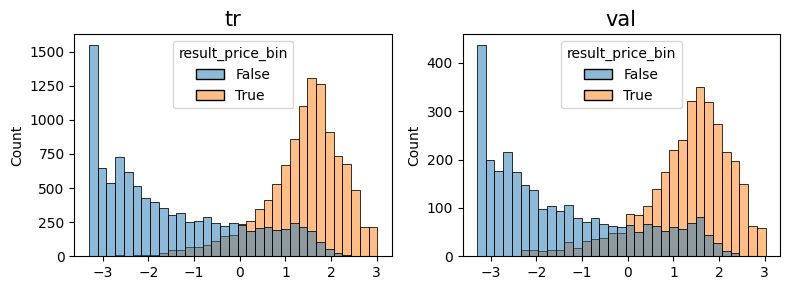

In [6]:
plot_scores(model, tr[features], tr.result_price_bin, val[features], val.result_price_bin)

Хорошо смотреть и на трейн, и на валидацию
Если скоры распределены не одинаково, то это повод смотреть

это для задачи регрессии, красная линия идеальное предсказание


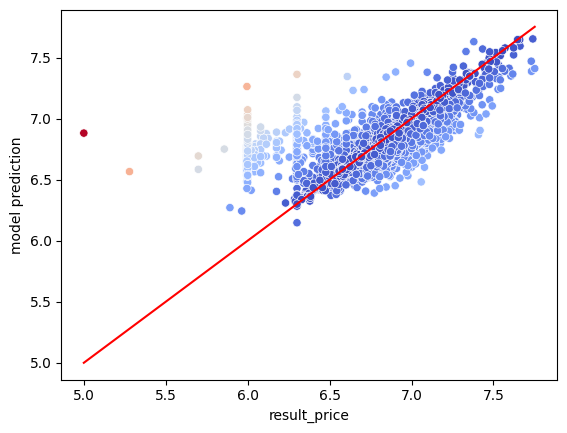

In [7]:
from local_utils import *

plot_scores_reg(model_reg, val[features], val.result_price)

**Скоры с разбиением по колонке**

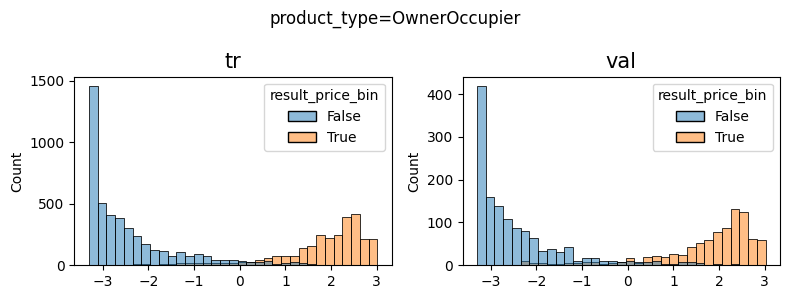

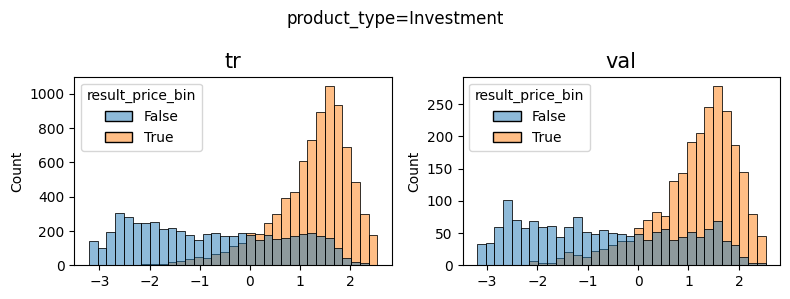

In [8]:
plot_scores(model, tr[features], tr.result_price_bin, val[features], val.result_price_bin, split_col='product_type')

скоры по новостройках и вторичках
в новостройках предсказания хуже, так как одни налезают на другие. можно думать в сторону того, как нагенерить новые информативные признаки для новостроек. Некоторые дешёвые предсказываются как дорогие.


**Скоры с support-колонкой (можно делать сабсэмплы мажоритарного класса)**

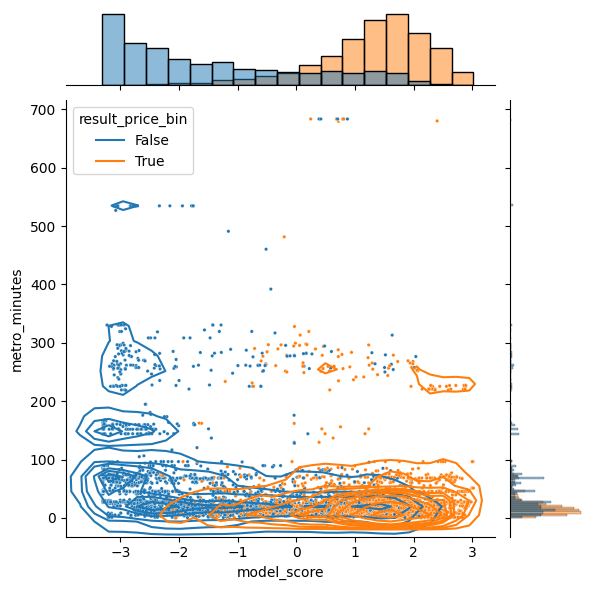

In [9]:
plot_scores(model, tr[features], tr.result_price_bin, val[features], val.result_price_bin, support_col='metro_minutes', support_log=False)

график двумерного распределения
скор и одна из колонок
Есть неадекватные всякие градации того, сколько можно идти до метро
это делает sns.joinplot
Если количество до метро маленькое, то модель путает, если нет, то всё хорошо распределяет. Лучше не рисовать все скитерплоты для всех фичей. 

это всё намекает на создание пользовательского скора на основе колонок

### Bonus: Эмбеддинги объектов через предсказания разных моделей

Суть эмбедингов в том, чтобы смотреть на данные и что-то о них узнавать
Есть эмбединги классные и не очень: не очень это заскелить числовые фичи и запихнуть в юмэп. Как делать хорошие?

Как идея обучить несколько разных моделей и получить на них скоры. 

In [10]:
%%time
from local_utils import *

val_scores = get_different_scores(tr, val, features, 'result_price_bin')

Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[299]	valid_0's auc: 0.911691
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[178]	valid_0's auc: 0.896365
Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[300]	valid_0's auc: 0.895733
0:	test: 0.8391424	best: 0.8391424 (0)	total: 187ms	remaining: 1m 33s
499:	test: 0.9069971	best: 0.9069971 (499)	total: 17.7s	remaining: 0us

bestTest = 0.9069970658
bestIteration = 499

CPU times: total: 1min 17s
Wall time: 23.9 s


<Axes: xlabel='logreg_score', ylabel='cb_score'>

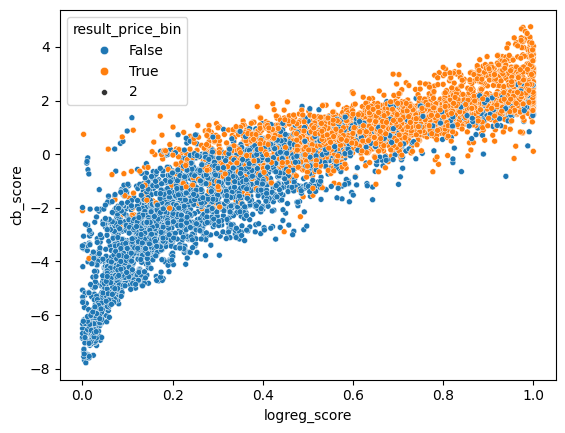

In [ ]:
sns.scatterplot(val_scores, x='logreg_score', y='cb_score', hue=val.result_price_bin, size=2)

Чем шире, тем больше они друг друга дополняют. Тем более они разные 

In [12]:
val_scores

,plain_score,rf_score,linear_score,cb_score,logreg_score
0,-0.779696,-5.545419,0.131279,-0.189557,0.356262
1,1.005928,158.423213,0.616162,0.860548,0.705351
2,-0.423307,-29.967536,-0.831663,-0.637647,0.255334
3,-2.141623,-221.503317,-1.939067,-1.881022,0.178129
4,-1.367803,-77.246142,-0.561963,-0.930483,0.328719
...,...,...,...,...,...
6259,1.674774,262.201636,1.868045,2.177606,0.880882
6260,2.040331,234.272055,2.027951,2.062812,0.887686
6261,-1.893709,-189.146399,-1.237434,-1.178641,0.631644
6262,0.325670,-7.936307,-0.165348,-0.076888,0.475277


In [13]:
import umap

mapper = umap.UMAP(n_jobs=16, init='pca', n_neighbors=101)
emb = mapper.fit_transform(val_scores)
emb

array([[ 3.5398655, 10.242183 ],
       [11.131819 , -0.8946812],
       [ 4.6123676, 13.605152 ],
       ...,
       [-4.683861 , 15.2877   ],
       [ 3.6146626, 10.408627 ],
       [ 5.2225504, 17.269121 ]], dtype=float32)

<Axes: >

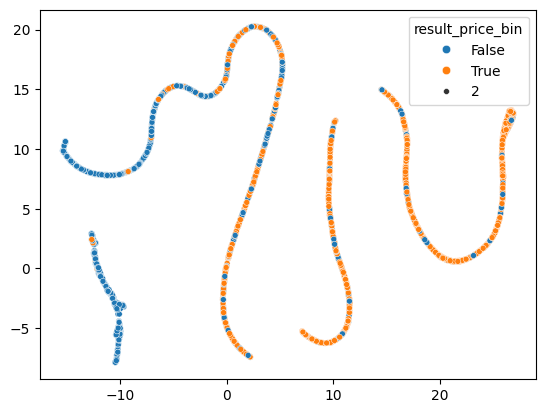

In [14]:
sns.scatterplot(x=emb[:, 0], y=emb[:, 1], hue=val.result_price_bin, size=2)

Мы эмбединги делаем не для того, чтобы потом на них обучаться, а чтобы понять что-то о данных. Как посмотреть чем отличаются класстеры. Теперь можно сделать подвыборку. Самое простое что можно сделать: взять модель кластеризации сделать новый таргет. а потом обучиться.  

## 2. Важности признаков: начальная школа

Чтобы трезвее взглянуть на важности признаков, хорошей практикой является добавить в выборку несколько рандомных фичей.

Для полноты эксперимента, добавим как float-фичи, так и категориальные с разным кол-вом уникальных. Будем называть их shadow features, дабы отдать дань уважения истории :)

In [ ]:
model_with_rnd, shadow_features, tr_rnd, val_rnd = train_model(tr, val, features, 'result_price_bin', params={'verbose': 1, 'importance_type': 'split'},
                                                        shadow_features=True, sklearn_style=True)
rnd_features = np.r_[features, shadow_features]
shadow_features

[LightGBM] [Info] Number of positive: 11010, number of negative: 9958
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8649
[LightGBM] [Info] Number of data points in the train set: 20968, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.525086 -> initscore=0.100428
[LightGBM] [Info] Start training from score 0.100428
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[58]	valid_0's binary_logloss: 0.390615


Index(['shadow_float_1', 'shadow_float_2', 'shadow_float_3', 'shadow_float_4',
       'shadow_float_5', 'shadow_cat_big_1', 'shadow_cat_big_2',
       'shadow_cat_big_3', 'shadow_cat_big_4', 'shadow_cat_big_5',
       'shadow_cat_small_1', 'shadow_cat_small_2', 'shadow_cat_small_3',
       'shadow_cat_small_4', 'shadow_cat_small_5'],
      dtype='object')

Добавляет в выборку случайные фичи чтобы в дальнейшем анализировать. 

### 2.1 Встроенные важности признаков

**LightGBM**

feature_importance: [  1   1   2  26   5   3  17  12  26   0 193   9   2   1  75  24   4   1
   8   2   0  12  21   4  20   4   5  31   5   6  16   6   6 245  20  11
   1   0   0   0   0 178 188 186 187 176   0   0   0   0   0] 



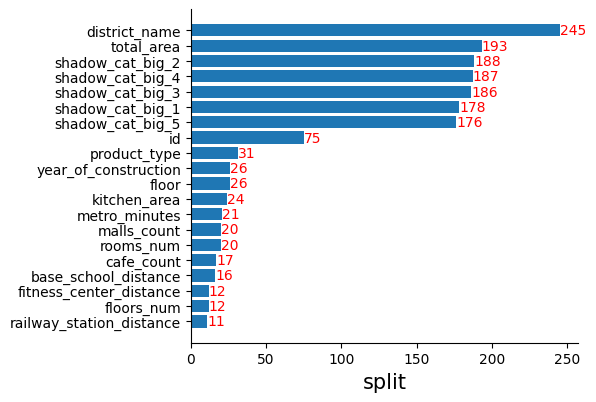

In [16]:
from local_utils import *

print('feature_importance:', model_with_rnd.feature_importances_, '\n')

plot_lgbm_importance(model_with_rnd, rnd_features, importance_type='split', top_k=20, sklearn_style=True)

качество всего остального -- сомнительно. категориальные большие это типа около норм, так как категориальные сортируются, это связано с алгоритмом. 
importance type показывает сколько раз фича участвовала при построении дерева. 

**CatBoost**

встроенные методы повторяют то, что будет дальше

### 2.2 Permutation importance

Сначала делается model.predict(X) -> scorer -> baseline_score<br>
Далее для каждой фичи вектор значений на X случайно пермутируется, после чего делается model.predict(X_with_fi_perturbed) -> scorer -> perm_score_i<br>
Важность фичи - разность между baseline_score и perm_score.

Более честный, но довольно долгий способ на больших выборках и с большИм кол-вом фич.

CPU times: total: 18.2 s
Wall time: 5.51 s


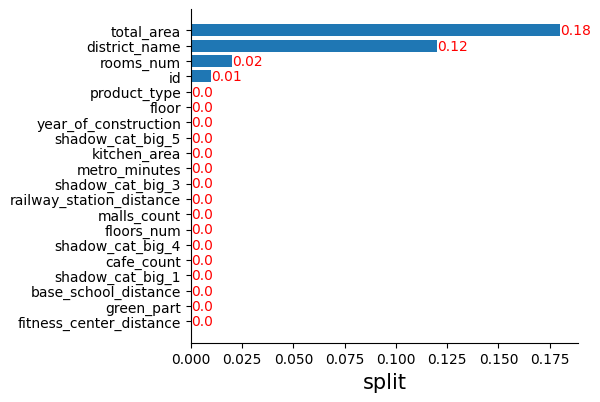

In [17]:
%%time
from sklearn.inspection import permutation_importance


importance_dict = permutation_importance(model_with_rnd, val_rnd[rnd_features], val.result_price_bin, scoring='roc_auc')
plot_lgbm_importance(model_with_rnd, rnd_features, importance_type='split', top_k=20, sklearn_style=True,
                     imps=importance_dict['importances_mean'], round_to=2)

это более долго. но довольно честно. Он ест только sclearn модели. 

## 3. trees_to_dataframe()
LightGBM:
```python
t = model.trees_to_dataframe()
```

CatBoost:

```python
model.save_model(format='json')

import json
t = json.load(open('model.json', 'r'))['oblivious_trees'] + распарсить :)
```

**CatBoost**

In [18]:
model_cb = train_cb_model(tr, val, features, 'result_price_bin')
model_cb.save_model('cb_model.json', format='json')
import json

t = json.load(open('cb_model.json', 'r'))['oblivious_trees']
t

0:	test: 0.8391424	best: 0.8391424 (0)	total: 33.9ms	remaining: 16.9s
499:	test: 0.9069971	best: 0.9069971 (499)	total: 17.5s	remaining: 0us

bestTest = 0.9069970658
bestIteration = 499



[{'leaf_values': [-0.042156079483056275,
   -0.006059264594739542,
   -0.0215948420108489,
   -0.01977595445264469,
   0,
   0,
   0,
   0,
   -0.023849043561983824,
   0.0007051378275155127,
   0.0012330307384395894,
   0.01215508197571849,
   -0.0018154964995742212,
   0.015338237555990597,
   0.016192258826077235,
   0.019274053373938643,
   -0.04779926509193885,
   -0.02093368339763234,
   -0.025138939230704455,
   -0.011268742146075905,
   0,
   0,
   0,
   0,
   -0.03250374419038871,
   -0.007575050326111906,
   0.00038190797878758805,
   0.012796101899300307,
   -0.0002459140258766139,
   0.005814431779836765,
   0.01808288698347513,
   0.023025850350968973,
   0,
   0,
   -0.0044333537225420645,
   0.01713080501327057,
   0,
   0,
   0,
   0,
   0,
   0,
   0.010574363508483776,
   0.015952196277755487,
   0,
   0,
   0.017853285344969917,
   0.026600004324961936,
   0,
   0,
   -0.019307492689351453,
   -0.011268742146075905,
   0,
   0,
   0,
   0,
   0,
   0,
   -0.023328893

**LightGBM**

In [19]:
t = model_with_rnd.booster_.trees_to_dataframe()
t

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-S1,0-S3,None,rooms_num,3067.989990,1.5,<=,left,NaN,0.100428,5228.800000,20968
1,0,2,0-S1,0-S4,0-S2,0-S0,district_name,2132.459961,10||11||15||21||27||38||42||48||52||62||64||72...,==,right,NaN,0.036943,3099.680000,12430
2,0,3,0-S4,0-S10,0-S15,0-S1,total_area,744.979004,71.5,<=,left,None,-0.051643,1438.120000,5767
3,0,4,0-S10,0-S11,0-L11,0-S4,product_type,113.585999,0,==,right,None,-0.076745,1293.740000,5188
4,0,5,0-S11,0-L0,0-S25,0-S10,total_area,215.395004,43.5,<=,left,None,-0.034889,431.910000,1732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3533,57,4,57-S3,57-L3,57-S9,57-S2,shadow_cat_big_5,18.212601,9||10||17||23||30||37||38||52||55||64||74||79|...,==,right,NaN,-0.032757,235.285000,2967
3534,57,5,57-L3,None,None,57-S3,None,NaN,None,None,None,None,0.031103,33.200082,379
3535,57,5,57-S9,57-L4,57-L10,57-S3,shadow_cat_big_2,15.667000,4||5||10||12||16||20||28||35||38||41||59||62||...,==,right,NaN,-0.044220,202.085000,2588
3536,57,6,57-L4,None,None,57-S9,None,NaN,None,None,None,None,0.017236,34.332919,430


указываются фичи по которым делаются сплиты. Можно посмотреть что вообще построилось. Можно построить попарные скетерплоты 

### 3.1 Профиль ансамбля

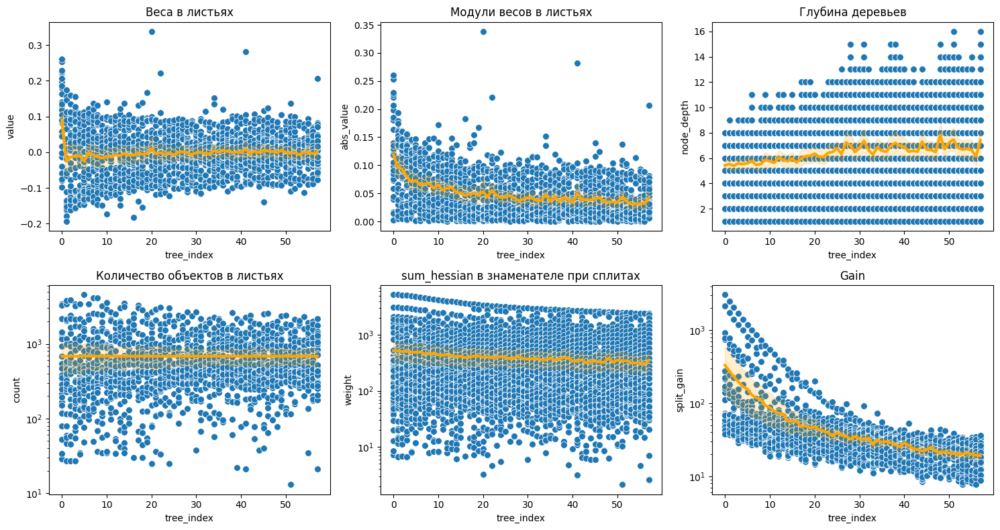

In [20]:
from local_utils import *

plot_ensemble_profile(t)

В первых деревьях какие-то веса больше. Среднее количество объектов в листе 
показывает какие параметры подкручивать. 
самый высокие гейн дают корни, если они равномерно убывают, значит всё время решаются 1 и те же задачи. например, если задача решается 100 деревьев подряд, то надо подкрутить learning rate чтобы она быстрее решалась. 

In [ ]:
t.query("node_depth == 1")

### 3.2 Важности признаков: advanced

Замер доли участия фичи на определённой глубине. 

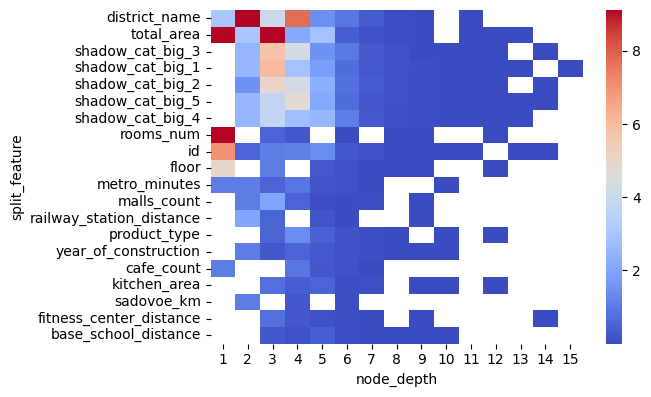

In [21]:
from warnings import filterwarnings
filterwarnings('ignore')

plot_feature_depth(t, top_k=20)

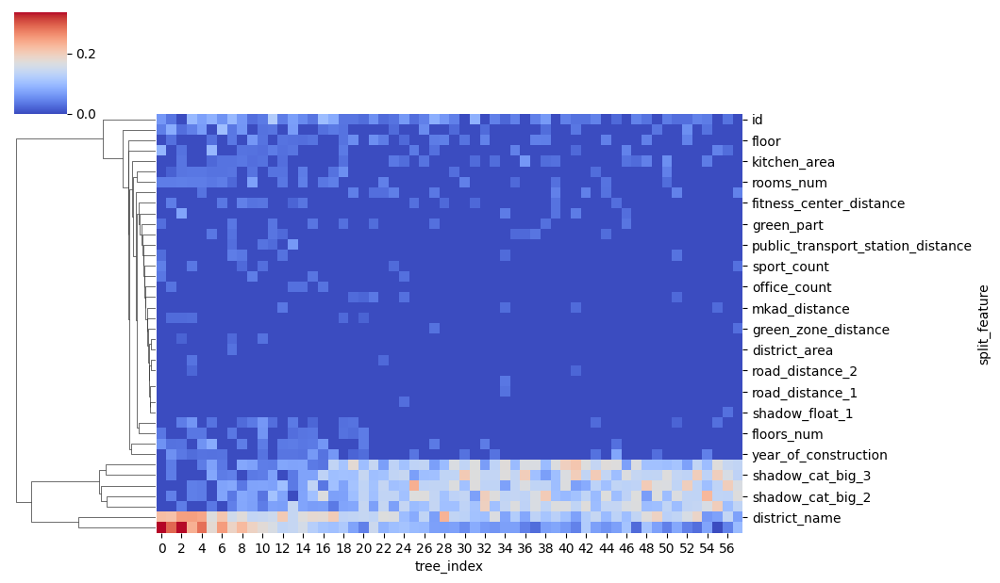

In [22]:
activations = plot_feature_info(t, top_k=30, return_activations=True)

Функция от номера дерева. Какие фичи в каких деревьях. Итог: есть 2 фичи важные, а остальные не важные. Большие категориальные не особо полезные. 

по сути эта карта == эмбединги для фичей. 

### 3.3 Эмбеддинги фичей

In [23]:
activations.head(3)

tree_index,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
split_feature,,,,,,,,,,,,,,,,,,,,,
base_school_distance,0.0,0.0,0.038656,0.058724,0.0,0.030401,0.0,0.000000,0.024837,0.036297,...,0.0,0.0,0.0,0.018748,0.0,0.0,0.0,0.027832,0.0,0.0
bulvar_ring_km,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.023461,0.0,0.0,0.0,0.000000,0.0,0.0
bus_station_distance,0.0,0.0,0.017168,0.000000,0.0,0.000000,0.0,0.022521,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0


CPU times: total: 4.34 s
Wall time: 4.45 s


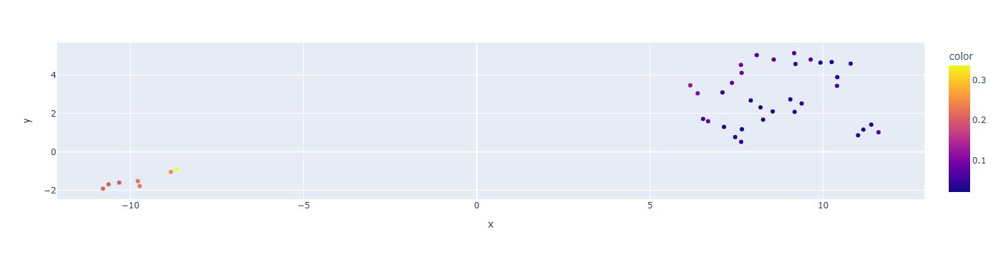

In [24]:
%%time
import umap

mapper = umap.UMAP(n_jobs=16, n_neighbors=3, metric='euclidean', a=1, b=0.9, random_state=1)
emb = mapper.fit_transform(activations)

import plotly.express as px

embs = pd.DataFrame({
    'x': emb[:, 0],
    'y': emb[:, 1],
    'feature': activations.index,
    'color': activations.max(axis=1)
})
px.scatter(data_frame=embs, x='x', y='y', hover_data='feature', color='color')

**!** если транспонировать activations, можно получить эмбеддинги деревьев (но это имеет так-то не очень много смысла)

In [25]:
t

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count,abs_value
0,0,1,0-S0,0-S1,0-S3,None,rooms_num,3067.989990,1.5,<=,left,NaN,0.100428,5228.800000,20968,0.100428
1,0,2,0-S1,0-S4,0-S2,0-S0,district_name,2132.459961,10||11||15||21||27||38||42||48||52||62||64||72...,==,right,NaN,0.036943,3099.680000,12430,0.036943
2,0,3,0-S4,0-S10,0-S15,0-S1,total_area,744.979004,71.5,<=,left,None,-0.051643,1438.120000,5767,0.051643
3,0,4,0-S10,0-S11,0-L11,0-S4,product_type,113.585999,0,==,right,None,-0.076745,1293.740000,5188,0.076745
4,0,5,0-S11,0-L0,0-S25,0-S10,total_area,215.395004,43.5,<=,left,None,-0.034889,431.910000,1732,0.034889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3533,57,4,57-S3,57-L3,57-S9,57-S2,shadow_cat_big_5,18.212601,9||10||17||23||30||37||38||52||55||64||74||79|...,==,right,NaN,-0.032757,235.285000,2967,0.032757
3534,57,5,57-L3,None,None,57-S3,None,NaN,None,None,None,None,0.031103,33.200082,379,0.031103
3535,57,5,57-S9,57-L4,57-L10,57-S3,shadow_cat_big_2,15.667000,4||5||10||12||16||20||28||35||38||41||59||62||...,==,right,NaN,-0.044220,202.085000,2588,0.044220
3536,57,6,57-L4,None,None,57-S9,None,NaN,None,None,None,None,0.017236,34.332919,430,0.017236


### 3.4 Эмбеддинги объектов

In [ ]:
from local_utils import *
# номер листа а не скор
leaf_matrix = model_with_rnd.booster_.predict(tr_rnd[rnd_features], pred_leaf=True)
object_leaf_attr = extract_attr_by_leaf_matrix(t, leaf_matrix, 'count')
object_leaf_attr
# скор для каждого листа
# лучше скейлить 

array([[3456., 3416., 3876., ...,  437., 2014.,  207.],
       [3300., 3773., 2431., ...,  341., 1019.,  457.],
       [3300., 3773.,  658., ...,  526.,  843.,  378.],
       ...,
       [3300., 3773., 1664., ..., 1322.,  394., 1467.],
       [2156., 2149., 2156., ...,  476., 1860.,  525.],
       [3300., 3773., 2431., ..., 1032., 1860.,  428.]])

иногда стоить подкручивать количество листьев в листе. 
# weight в таблице это сумма гесионов


CPU times: total: 2min 42s
Wall time: 1min


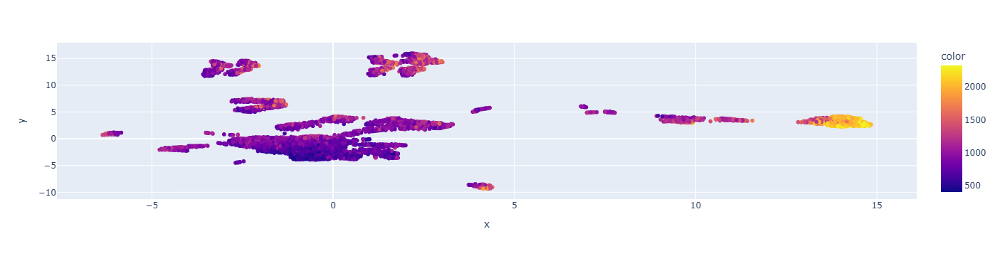

In [27]:
%%time
mapper = umap.UMAP(n_jobs=16, n_neighbors=30, metric='euclidean', random_state=1)
emb = mapper.fit_transform(object_leaf_attr)

embs = pd.DataFrame({
    'x': emb[:, 0],
    'y': emb[:, 1],
    'color': np.median(object_leaf_attr, axis=1)
})
fig = px.scatter(data_frame=embs, x='x', y='y', color='color')
fig.update_layout(width=800)

In [ ]:
нужно кластеризовать дальше, и пытаться как-то понять, почему модель ошибается.

### 3.5 Карта объектов по атрибуту

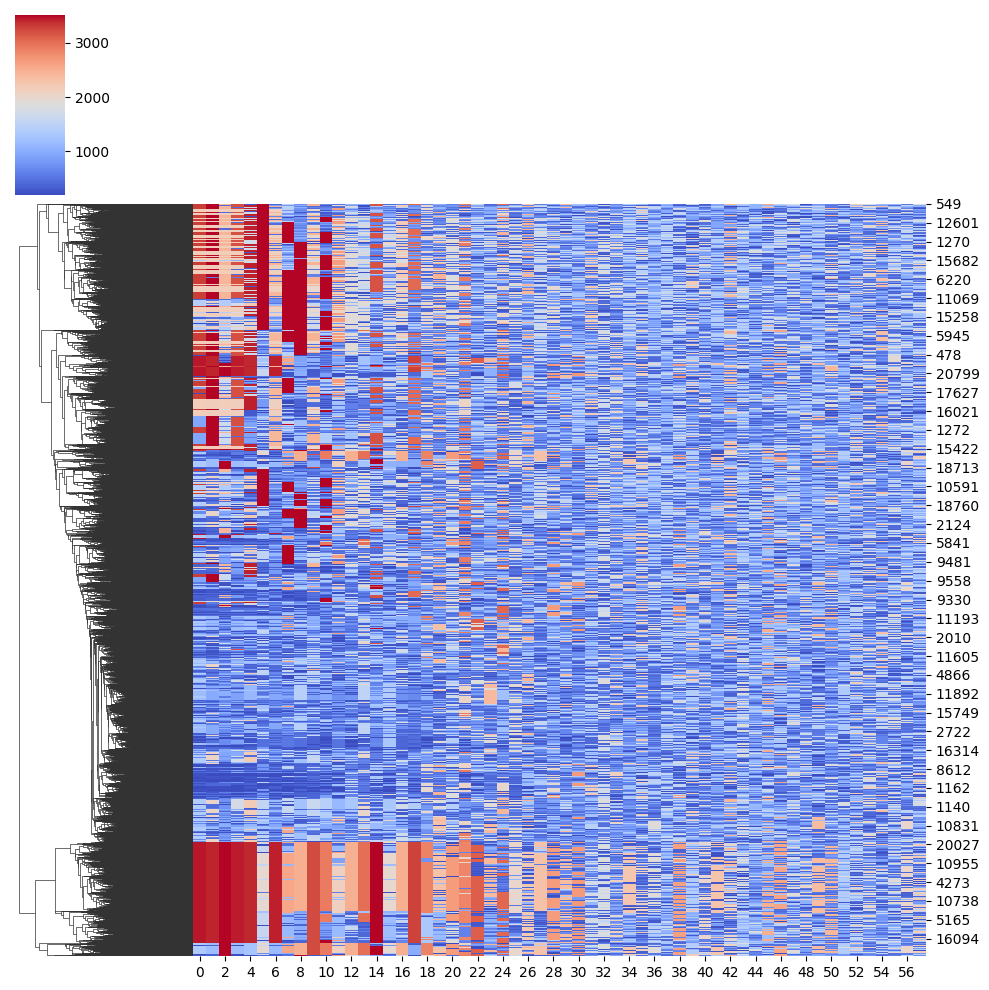

In [28]:
sns.clustermap(object_leaf_attr, robust=True, col_cluster=False, cmap='coolwarm')
# y_raw_tr = model_with_rnd.predict(tr_rnd[rnd_features])
# idx = np.argsort(y_raw_tr)
# sns.heatmap(object_leaf_attr[idx], cmap='coolwarm')

In [ ]:
выделяет класстеры по скору по атрибуту
для каждого объекта есть аттрибут мы хотим посмотреть как с каждым новым деревом получают скор

это нам позволяет понять, что всё самое важно происходит на важных деревьях.
ealy stopping помогает выбрать

этот график мэппится с одним из тех, что были в начале

## 4. shap

Scott Lundberg

2017 - [A Unified Approach to Interpreting Model
Predictions](https://arxiv.org/pdf/1705.07874)<br>
2018 - [Consistent feature attribution for tree ensembles](https://arxiv.org/pdf/1706.06060)<br>
2019 - [Consistent Individualized Feature Attribution for Tree
Ensembles ](https://arxiv.org/pdf/1802.03888)<br>
2019 - [Explainable AI for Trees: From Local Explanations to Global
Understanding](https://arxiv.org/pdf/1905.04610)

Бустинги слабо интерпретируются, непонятен вклад каждой фичи в модель 
предсказания можно представить в виде суммы вкладов весов.
фреймворк Lime и Shap как раз пытаются это делать.

ко всем методам которые так раскладывают можно предъявить три требования. если это сделать то единственное решение будет выглядеть так: 
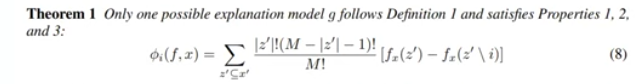
для деревьев эти штуки считаются за квадратичное время 
шап это вклад каждой фичи для каждого объекта


In [29]:
import shap

explainer = shap.TreeExplainer(model_with_rnd)
shap_values = explainer(val_rnd[rnd_features])
print('features shape:', rnd_features.shape)

print('\n\nshap values structure:')
print('.values:', shap_values.values.shape, '.base_values:', shap_values.base_values.shape, '.data:', shap_values.data.shape)
shap_values # .values - shap values, .base_values - EF(X)=среднее_предсказание, .data - наши данные

features shape: (51,)


shap values structure:
.values: (6264, 51) .base_values: (6264,) .data: (6264, 51)


.values =
array([[-6.47524824e-04,  2.21777103e-03,  1.18441525e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-1.44181949e-03,  9.42897230e-04,  2.10516641e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 2.41516315e-04, -4.93468745e-04, -4.27779444e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [-1.08999574e-03,  8.43599786e-04,  1.85169771e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 4.06550832e-04,  5.44510570e-04,  1.18441525e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.26313777e-03, -7.09688233e-04, -3.03035199e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

.base_values =
array([-0.01443019, -0.01443019, -0.01443019, ..., -0.01443019,
       -0.01443019, -0.01443019])

.data =
array([[6407578.1, 1.422391404, 3.830951404, ..., '2', '3', '2'],
       [7506452.02, 0.284868136, 1.478528507

In [30]:
from local_utils import *

pretty_print(dir(shap_values))

['__add__', '__class__', '__copy__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', 
	'__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', 
	'__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__mul__', '__ne__', 
	'__new__', '__radd__', '__reduce__', '__reduce_ex__', '__repr__', '__rmul__', '__rsub__', 
	'__setattr__', '__sizeof__', '__str__', '__sub__', '__subclasshook__', '__truediv__', 
	'__weakref__', '_apply_binary_operator', '_flatten_feature_names', '_numpy_func', '_s', 
	'_use_data_as_feature_names', 'abs', 'argsort', 'base_values', 'clustering', 'cohorts', 
	'compute_time', 'data', 'display_data', 'error_std', 'feature_names', 'flip', 'hclust', 
	'hierarchical_values', 'hstack', 'identity', 'instance_names', 'lower_bounds', 'main_effects', 
	'max', 'mean', 'min', 'op_history', 'output_dims', 'output_indexes', 'output_names', 
	'percentile', 'sample', 'shape', 'sum', 'upper_bounds', 'values']


### 4.1 Графики на выборке

`shap.plots.beeswarm` - база

Толковая важность фич, на которой видно, какие (высокие/средние/низкие) значения каждой фичи в какую сторону клонят ответы модели

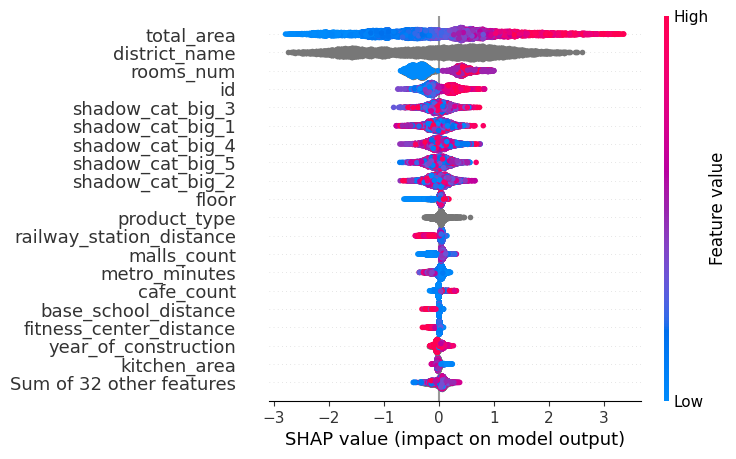

In [31]:
shap.plots.beeswarm(shap_values, max_display=20, order=shap.Explanation.abs.max(0), plot_size=(6, 5))

по оси х шап вэлью 
по оси у фичи 
каждая точка на графики - объект
категориальные покрашены в некоторый цвета некоторые нет.  

`shap.plots.scatter` - показывает детали каждой строчки beeswarm plot.<br>
Красит по колонке, которая по приблизительным подсчетам имеет наибольший interaction-показатель к нашей фиче (или по заданной руками)

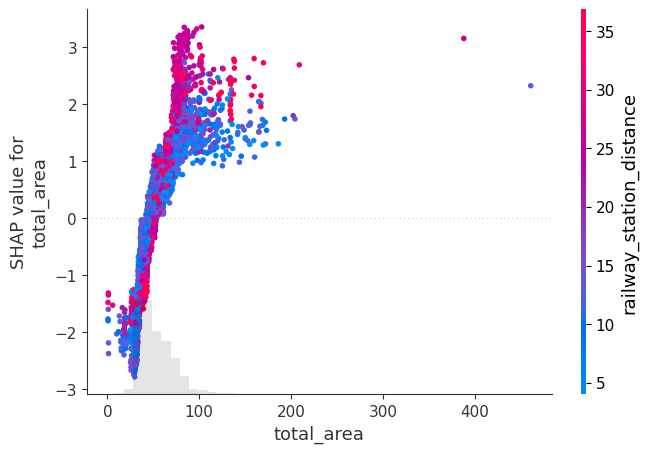

In [32]:
shap.plots.scatter(shap_values[:, 'total_area'], color=shap_values, x_jitter=0.7)

In [ ]:
по оси х значение фичи по у вклад
красит в ту фичу которая по приближенным подсчётам больше всего влияет на на основную фичу

`shap.dependance_plot` - scatter для категорий

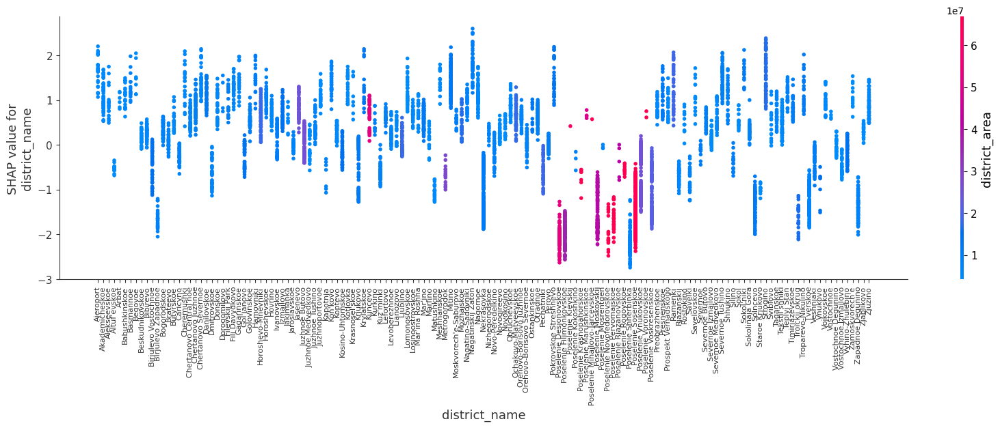

In [33]:
shap.dependence_plot('district_name', shap_values.values, features=val_rnd, interaction_index='district_area', show=False)
plt.gca().tick_params('x', labelsize=8)
plt.gcf().set_size_inches(20, 5)

In [ ]:
районы которые тянут вниз большие деревни)) 

`shap.plots.force` - кластеризация объектов по вкладам фич в предсказание

In [34]:
shap.initjs()
shap.plots.force(shap_values[:300])

`shap.plots.heatmap` - почти то же самое

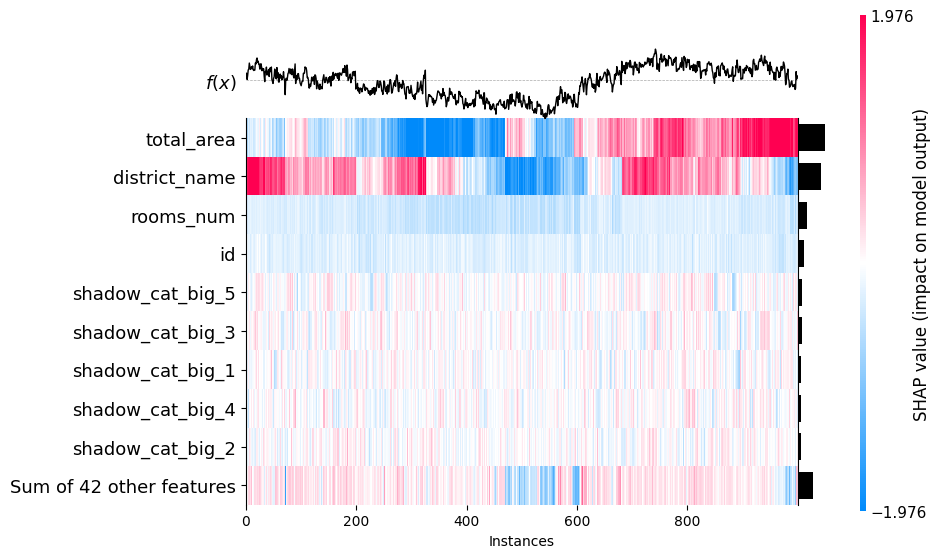

In [35]:
shap.plots.heatmap(shap_values[:1000])

In [ ]:
по оси х объекты 
они отсортированы по кластерам и цвет это шапвэлю


### 4.2 Графики на одном объекте

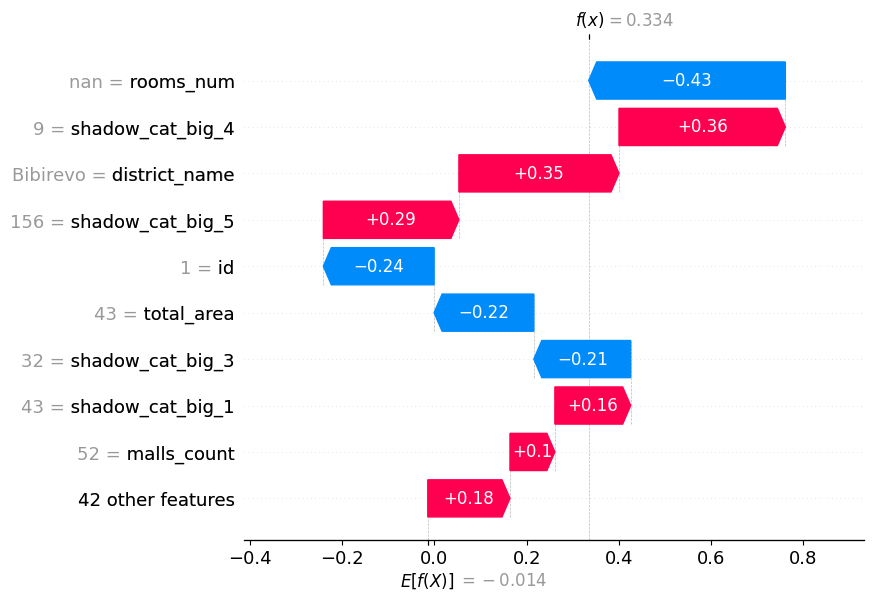

In [36]:
shap.plots.waterfall(shap_values[0])

In [37]:
# shap.plots.decision_plot

### 4.3 Эмбеддинги объектов через shap_values - одно из лучших решений на рынке эмбеддингов @_@

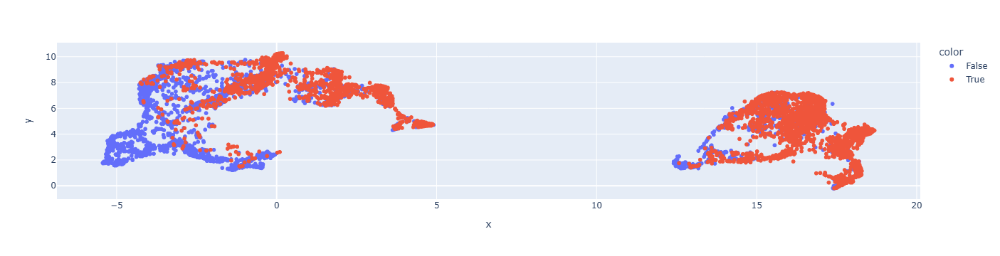

In [38]:
mapper = umap.UMAP(n_jobs=1, n_neighbors=30, metric='euclidean', random_state=1)
emb = mapper.fit_transform(shap_values.values)

embs = pd.DataFrame({
    'x': emb[:, 0],
    'y': emb[:, 1],
    'color': val.result_price_bin
})
fig = px.scatter(data_frame=embs, x='x', y='y', color='color')
fig.update_layout(width=800)

In [ ]:
Прям очень крутые эмбединги 

### 4.4 Эмбеддинги признаков

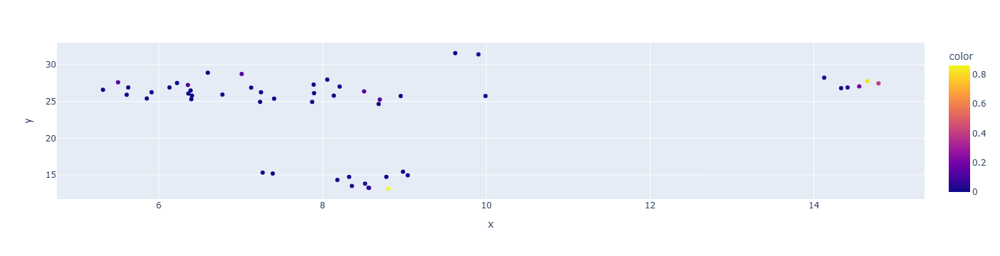

In [39]:
mapper = umap.UMAP(n_jobs=1, n_neighbors=7, metric='euclidean', random_state=2, a=1, b=0.5, min_dist=0.0001)
emb = mapper.fit_transform(shap_values.values.T)

embs = pd.DataFrame({
    'x': emb[:, 0],
    'y': emb[:, 1],
    'features': rnd_features,
    'color': np.median(np.abs(shap_values.values.T), axis=1)
})
fig = px.scatter(data_frame=embs, x='x', y='y', color='color', hover_data=['features'])
fig.update_layout(width=800)

### 4.5 shap_interaction_values - попарные взаимодействия признаков

In [40]:
%%time
from local_utils import *
import catboost as cb

explainer = shap.TreeExplainer(model_cb)
val_pool = cb.Pool(val_rnd[rnd_features], val.result_price_bin, cat_features=val_rnd[rnd_features].select_dtypes('category').columns.to_list())
shap_interaction_values = explainer.shap_interaction_values(val_pool)
print(shap_interaction_values.shape)
shap_interaction_values[:2]

(6264, 51, 51)
CPU times: total: 3min 11s
Wall time: 50.5 s


array([[[ 0.02006167,  0.00019116, -0.00050921, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.00019116,  0.00124669,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [-0.00050921,  0.        , -0.00078446, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ]],

       [[ 0.01006076,  0.00013563,  0.00045197, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.00013563,  0.00488737,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.00045197,  0.        ,  0.01714851, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  

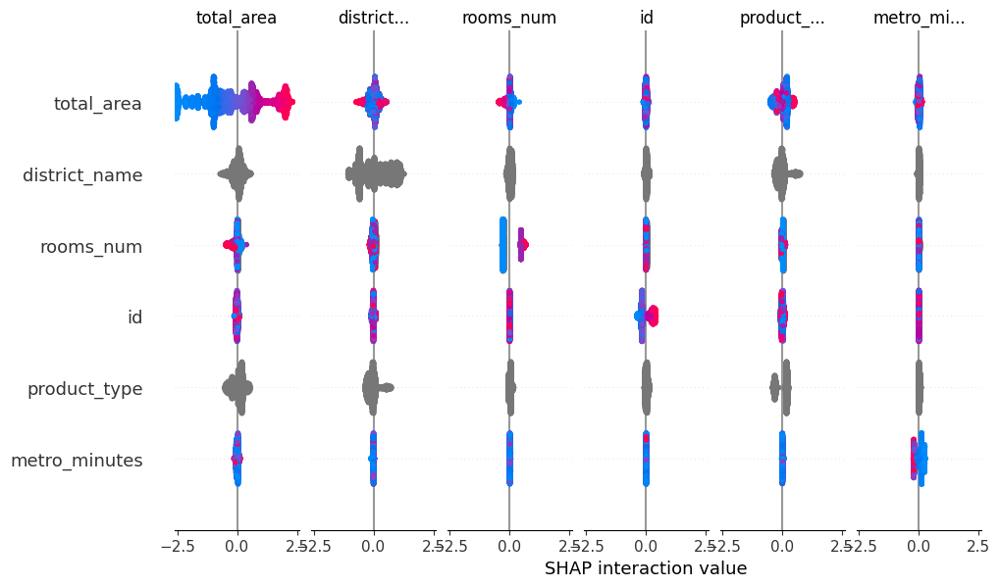

In [41]:
shap.summary_plot(shap_interaction_values, max_display=6, features=val_rnd)

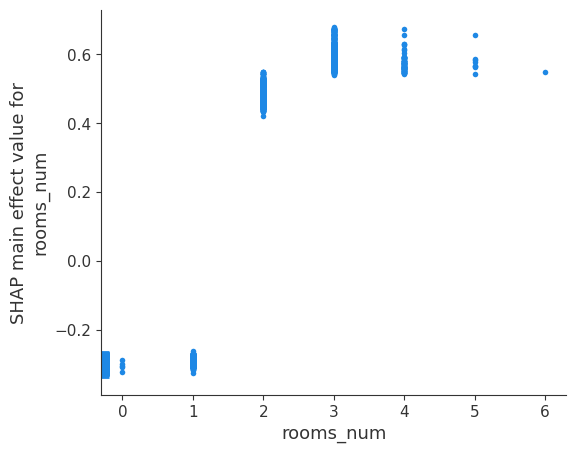

In [42]:
shap.dependence_plot(('rooms_num', 'rooms_num'), shap_interaction_values, features=val_rnd)

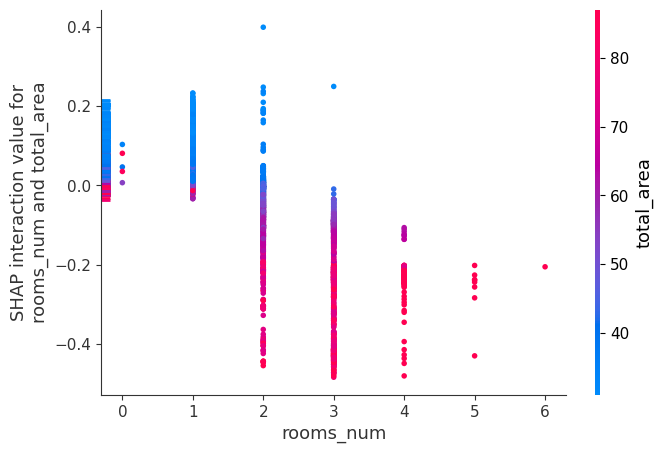

In [43]:
shap.dependence_plot(('rooms_num', 'total_area'), shap_interaction_values, features=val_rnd)

## 5. Shapley flow - out of scope, но обязательно изучите!

https://arxiv.org/pdf/2010.14592